# Projet 6 — Préparation des données pour le scoring crédit

**Contexte métier.** *Home Credit* accorde des crédits à la consommation à une clientèle souvent peu ou pas bancarisée. L'objectif est de construire un **modèle de scoring** qui estime la probabilité qu'un client ne rembourse pas son crédit (`TARGET = 1` = défaut), afin d'automatiser la décision d'octroi.

**Objectif de ce notebook.** Explorer les données brutes, comprendre leur structure et leur qualité, puis produire un **jeu de données propre, fusionné et enrichi**, prêt pour l'entraînement.

**Structure des données.** Les données sont réparties sur plusieurs tables reliées par des clés :

| Table | Grain (1 ligne = …) | Clé | Rôle |
|---|---|---|---|
| `application_{train,test}` | 1 demande de crédit courante | `SK_ID_CURR` | Table principale, contient la cible `TARGET` |
| `bureau` | 1 crédit antérieur déclaré à un autre organisme | `SK_ID_CURR` / `SK_ID_BUREAU` | Historique de crédit externe |
| `bureau_balance` | 1 mois d'un crédit `bureau` | `SK_ID_BUREAU` | Soldes mensuels externes |
| `previous_application` | 1 demande antérieure chez Home Credit | `SK_ID_CURR` / `SK_ID_PREV` | Historique interne |
| `POS_CASH_balance` | 1 mois d'un crédit POS/cash antérieur | `SK_ID_PREV` | Soldes mensuels |
| `installments_payments` | 1 échéance payée | `SK_ID_PREV` | Historique de paiement |
| `credit_card_balance` | 1 mois d'une carte de crédit | `SK_ID_PREV` | Soldes mensuels carte |

**Démarche retenue.**
1. **EDA** (inspirée du kernel *Will Koehrsen — « Start Here: A Gentle Introduction »*) : inspection, qualité, distribution de la cible, anomalies, corrélations.
2. **Feature engineering & fusion** (inspiré du kernel *Aguiar — « LightGBM with Simple Features »*, implémenté dans [`preprocess_datasets.py`](preprocess_datasets.py)) : agrégation de chaque table auxiliaire **par client** puis jointure sur `SK_ID_CURR`, avec création de ratios métier.

In [53]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import missingno as msno

import warnings
warnings.filterwarnings('ignore')

## 1. Chargement et inspection des sources

On charge chaque fichier séparément et on inspecte sa forme (`shape`) et ses premières lignes (`head`) pour repérer les clés de jointure, les types et les valeurs manquantes.

In [54]:
# List files available
print(os.listdir("data/"))

['application_test.csv', 'application_train.csv', 'bureau.csv', 'bureau_balance.csv', 'credit_card_balance.csv', 'HomeCredit_columns_description.csv', 'installments_payments.csv', 'POS_CASH_balance.csv', 'previous_application.csv', 'processed_data.csv', 'sample_submission.csv']


In [55]:
# Training data
app_train = pd.read_csv('data/application_train.csv')
print('Training data shape: ', app_train.shape)
app_train.head()

Training data shape:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [56]:
# Testing data features
app_test = pd.read_csv('data/application_test.csv')
print('Testing data shape: ', app_test.shape)
app_test.head()

Testing data shape:  (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
# Vérification des doublons dans la table principale (point de vigilance du brief)
print("app_train : lignes dupliquées (toutes colonnes)      :", app_train.duplicated().sum())
print("app_train : SK_ID_CURR dupliqués (doit être 0)        :", app_train['SK_ID_CURR'].duplicated().sum())
print("app_test  : SK_ID_CURR dupliqués (doit être 0)        :", app_test['SK_ID_CURR'].duplicated().sum())
# Aucun client ne doit apparaître à la fois dans train et test
inter = set(app_train['SK_ID_CURR']) & set(app_test['SK_ID_CURR'])
print("Clients communs train/test (doit être 0)             :", len(inter))

app_train : lignes dupliquées (toutes colonnes)      : 0
app_train : SK_ID_CURR dupliqués (doit être 0)        : 0
app_test  : SK_ID_CURR dupliqués (doit être 0)        : 0
Clients communs train/test (doit être 0)             : 0


In [58]:
bur_bal = pd.read_csv('data/bureau_balance.csv')
print('Bureau balance data shape: ', bur_bal.shape)
bur_bal.head()

Bureau balance data shape:  (27299925, 3)


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [59]:
bur = pd.read_csv('data/bureau.csv')
print('Bureau data shape: ', bur.shape)
bur.head()

Bureau data shape:  (1716428, 17)


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [60]:
# Merge les datasets 'bureau'
bur = bur.merge(bur_bal, how='left', on='SK_ID_BUREAU')
print('Bureau data shape after merge: ', bur.shape)
bur.head()

Bureau data shape after merge:  (25121815, 19)


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,MONTHS_BALANCE,STATUS
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN,NaN,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN,NaN,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN,NaN,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN,NaN,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN,NaN,NaN


In [61]:
pos_cash = pd.read_csv('data/POS_CASH_balance.csv')
print('POS_CASH_balance data shape: ', pos_cash.shape)
pos_cash.head()

POS_CASH_balance data shape:  (10001358, 8)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [62]:
installments = pd.read_csv('data/installments_payments.csv')
print('Installments data shape: ', installments.shape)
installments.head()

Installments data shape:  (13605401, 8)


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [63]:
credit_card = pd.read_csv('data/credit_card_balance.csv')
print('Credit card balance data shape: ', credit_card.shape)
credit_card.head()

Credit card balance data shape:  (3840312, 23)


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [64]:
prev_app = pd.read_csv('data/previous_application.csv')
print('Previous application data shape: ', prev_app.shape)
prev_app.head()

Previous application data shape:  (1670214, 37)


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


### ⚠️ Point de vigilance : ne pas fusionner naïvement

Les tables auxiliaires (`bureau`, `previous_application`, `POS_CASH_balance`, `installments_payments`, `credit_card_balance`) contiennent **plusieurs lignes par client**. Une jointure directe sur `SK_ID_CURR` produirait donc une **explosion du nombre de lignes** (relation un-à-plusieurs) : on n'aurait plus « 1 ligne = 1 client », les lignes de `application_train` seraient dupliquées, et la cible serait répétée — ce qui fausse tout entraînement et introduit des fuites entre train/validation.

**La bonne approche** (celle du kernel Aguiar, section 3) est donc :
1. **agréger** chaque table auxiliaire par `SK_ID_CURR` (min / max / mean / sum / var, comptages…) pour obtenir **une seule ligne par client** ;
2. **puis** joindre ces agrégats à `application` en `left join`, ce qui préserve le grain « 1 ligne = 1 client » et le nombre de lignes.

La cellule suivante illustre concrètement l'explosion pour bien la comprendre.

In [65]:
# Démonstration du piège : plusieurs lignes par client dans les tables auxiliaires
lignes_par_client = pos_cash.groupby('SK_ID_CURR').size()
print("POS_CASH_balance -> lignes par client : min=%d, mediane=%d, max=%d"
      % (lignes_par_client.min(), lignes_par_client.median(), lignes_par_client.max()))

# Nombre de lignes qu'une jointure NAIVE app_train x POS_CASH produirait
# (on ne joint que la clé pour rester léger en mémoire)
n_naif = app_train[['SK_ID_CURR']].merge(
    pos_cash[['SK_ID_CURR']], on='SK_ID_CURR', how='left'
).shape[0]
print("\napp_train seul            : %8d lignes (1 par client)" % app_train.shape[0])
print("app_train x POS_CASH naif : %8d lignes  -> explosion (~x%.0f) !"
      % (n_naif, n_naif / app_train.shape[0]))
print("\n=> On agregera donc chaque table par client AVANT de joindre (cf. section 3).")

POS_CASH_balance -> lignes par client : min=1, mediane=22, max=295

app_train seul            :   307511 lignes (1 par client)
app_train x POS_CASH naif :  8561442 lignes  -> explosion (~x28) !

=> On agregera donc chaque table par client AVANT de joindre (cf. section 3).


## 2. Analyse exploratoire (EDA)

*Démarche inspirée du kernel de Will Koehrsen.* On travaille ici sur `application_train` / `application_test` (grain « 1 ligne = 1 client ») pour comprendre la cible, la qualité des variables et les anomalies **avant** toute fusion.

### 2.1 Distribution de la cible — un problème déséquilibré

`TARGET` vaut **1** si le client a eu des difficultés de paiement, **0** sinon. On regarde sa distribution car le **déséquilibre des classes** est un enjeu métier central du scoring.

In [66]:
app_train['TARGET'].value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

<Axes: ylabel='Frequency'>

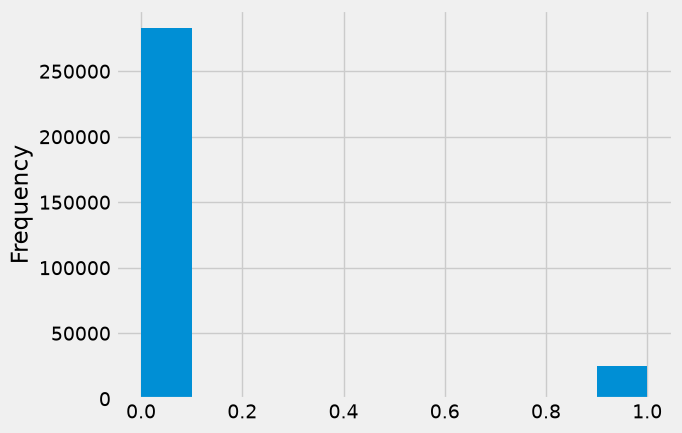

In [67]:
app_train['TARGET'].astype(int).plot.hist()

**Lecture.** Seuls ~**8 %** des clients sont en défaut (`TARGET = 1`) : le jeu est **fortement déséquilibré**. Implications :
- Une *accuracy* brute est trompeuse (un modèle prédisant toujours « 0 » atteint ~92 %). On privilégiera l'**AUC / AUC-PR** et un score métier.
- **Enjeu métier asymétrique** : un faux négatif (accorder un crédit à un futur défaillant) coûte bien plus cher qu'un faux positif (refuser un bon client). Le seuil de décision devra être optimisé sur un **coût métier**, pas sur 0,5.
- Le déséquilibre se traite **à l'entraînement** (ex. `class_weight='balanced'`, `scale_pos_weight` pour LightGBM, ou ré-échantillonnage SMOTE) — pas en supprimant des lignes ici.

### 2.2 Valeurs manquantes

De nombreuses colonnes (surtout celles décrivant le logement : `*_AVG`, `*_MODE`, `*_MEDI`) présentent jusqu'à ~70 % de valeurs manquantes. **Point de vigilance : on ne les supprime pas trop vite** — un taux élevé peut être informatif (ex. absence de bien immobilier), et certains modèles gèrent nativement les `NaN`. On documente ici l'ampleur du phénomène ; la stratégie d'imputation est discutée juste après.

In [68]:
# Function to calculate missing values by column# Funct
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()

        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)

        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})

        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)

        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")

        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [69]:
# Missing values statistics
missing_values = missing_values_table(app_train)
missing_values.head(20)

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_MODE,214865,69.9
COMMONAREA_AVG,214865,69.9
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_AVG,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_MODE,210199,68.4


**Stratégie d'imputation (documentée, comme l'exige le brief).** On ne supprime pas les colonnes sur le seul critère du taux de manquants :
- **Modèle à base d'arbres (LightGBM, la cible)** : gère nativement les `NaN` → **aucune imputation nécessaire**, ce qui évite d'introduire un biais.
- **Modèle linéaire / distance (régression logistique, baseline)** : imputation requise → médiane pour les numériques, modalité « manquant » explicite pour les catégorielles, l'imputation étant apprise sur le train puis appliquée au test (via un `Pipeline` scikit-learn) pour éviter toute fuite.
- Cas particulier déjà traité : la sentinelle `DAYS_EMPLOYED = 365243` → `NaN` + flag (section 2.5).

### 2.3 Types de colonnes

On distingue les variables **numériques** (`int`/`float`) des variables **catégorielles** (`object`). Le nombre de modalités par variable catégorielle conditionne la stratégie d'encodage (section suivante).

In [70]:
# Number of each type of column
app_train.dtypes.value_counts()

float64    65
int64      41
str        16
Name: count, dtype: int64

In [71]:
# Number of unique classes in each object column
app_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

### 2.4 Encodage des variables catégorielles

**Point de vigilance du brief : l'encodage doit être cohérent avec le type de modèle.** Un encodage numérique arbitraire (`0,1,2,…`) impose un **ordre** et une **distance** entre modalités : correct pour une variable **ordinale**, mais trompeur pour une variable **nominale** (ex. `ORGANIZATION_TYPE`), où un modèle linéaire interpréterait à tort `2 > 1 > 0`.

Stratégie retenue ici (approche Koehrsen) :
- **Label Encoding** pour les variables binaires (≤ 2 modalités) : un seul entier `0/1`, sans hypothèse d'ordre abusive.
- **One-Hot Encoding** (`pd.get_dummies`) pour les variables nominales à plus de 2 modalités : une colonne indicatrice par modalité, aucune relation d'ordre imposée.
- `align(join='inner')` ensuite pour **garder les mêmes colonnes** entre train et test (le one-hot peut créer des modalités absentes de l'un des deux).

> Remarque : la section 3 (kernel Aguiar) utilise, elle, le One-Hot systématique — bien adapté à **LightGBM**, le modèle cible.

In [72]:
# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in app_train:
    if app_train[col].dtype == 'object':
        # If 2 or fewer unique categories
        if len(list(app_train[col].unique())) <= 2:
            # Train on the training data
            le.fit(app_train[col])
            # Transform both training and testing data
            app_train[col] = le.transform(app_train[col])
            app_test[col] = le.transform(app_test[col])

            # Keep track of how many columns were label encoded
            le_count += 1

print('%d columns were label encoded.' % le_count)

0 columns were label encoded.


In [73]:
# one-hot encoding of categorical variables
app_train = pd.get_dummies(app_train)
app_test = pd.get_dummies(app_test)

print('Training Features shape: ', app_train.shape)
print('Testing Features shape: ', app_test.shape)

Training Features shape:  (307511, 246)
Testing Features shape:  (48744, 242)


In [74]:
train_labels = app_train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
app_train, app_test = app_train.align(app_test, join = 'inner', axis = 1)

# Add the target back in
app_train['TARGET'] = train_labels

print('Training Features shape: ', app_train.shape)
print('Testing Features shape: ', app_test.shape)

Training Features shape:  (307511, 243)
Testing Features shape:  (48744, 242)


### 2.5 Anomalies et corrélations

On inspecte l'âge (`DAYS_BIRTH`, en jours négatifs) et l'ancienneté d'emploi (`DAYS_EMPLOYED`). Cette dernière contient une **valeur sentinelle aberrante `365243`** (~1000 ans) qui code en réalité un « non renseigné » : on la remplace par `NaN` et on garde une trace via un **flag** `DAYS_EMPLOYED_ANOM`. On regarde ensuite les corrélations avec la cible (notamment les scores externes `EXT_SOURCE_*`, les plus prédictifs).

In [75]:
(app_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [76]:
app_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

Text(0.5, 0, 'Days Employment')

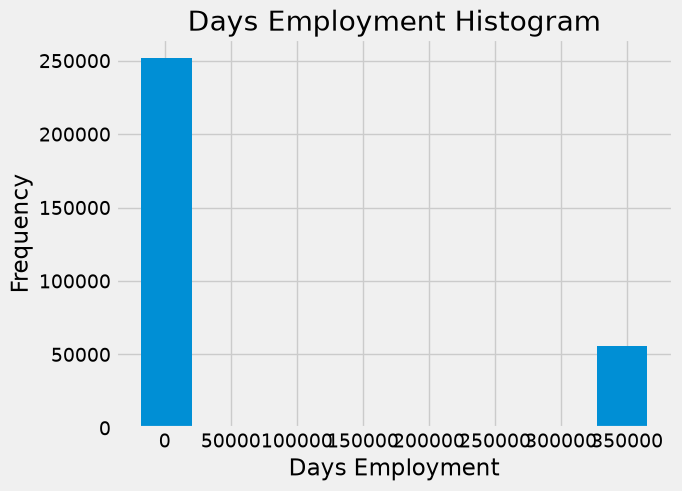

In [77]:
app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram')
plt.xlabel('Days Employment')

In [78]:
anom = app_train[app_train['DAYS_EMPLOYED'] == 365243]
non_anom = app_train[app_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


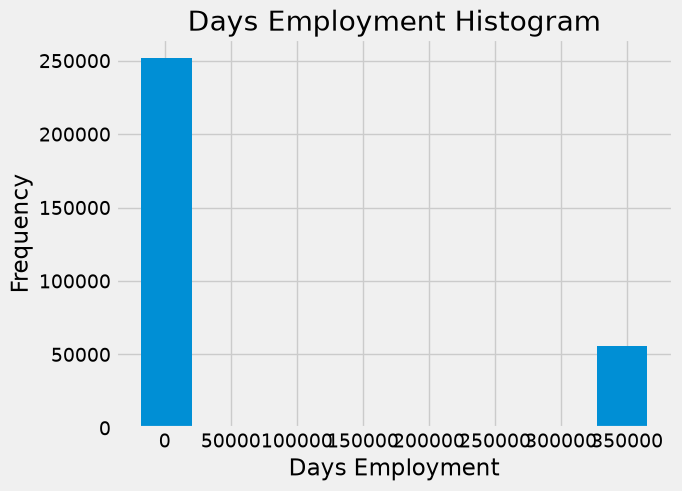

In [79]:
# Create an anomalous flag column
app_train['DAYS_EMPLOYED_ANOM'] = app_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
app_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

In [80]:
app_test['DAYS_EMPLOYED_ANOM'] = app_test["DAYS_EMPLOYED"] == 365243
app_test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

print('There are %d anomalies in the test data out of %d entries' % (app_test["DAYS_EMPLOYED_ANOM"].sum(), len(app_test)))

There are 9274 anomalies in the test data out of 48744 entries


In [81]:
# Find correlations with the target and sort
correlations = app_train.corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 DAYS_REGISTRATION                                    0.041975
OCCUPATION_TYPE_Laborers                             0.043019
FLAG_DOCUMENT_3                                      0.044346
REG_CITY_NOT_LIVE_CITY                               0.044395
FLAG_EMP_PHONE                                       0.045982
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
REG_CITY_NOT_WORK_CITY                               0.050994
DAYS_ID_PUBLISH                                      0.051457
CODE_GENDER_M                                        0.054713
DAYS_LAST_PHONE_CHANGE                               0.055218
NAME_INCOME_TYPE_Working                             0.057481
REGION_RATING_CLIENT                                 0.058899
REGION_RATING_CLIENT_W_CITY                          0.060893
DAYS_BIRTH                                           0.078239
TARGET                                               1.000000
Name: TARGET, dtype: float64

Most Negati

In [82]:
# Find the correlation of the positive days since birth and target
app_train['DAYS_BIRTH'] = abs(app_train['DAYS_BIRTH'])
app_train['DAYS_BIRTH'].corr(app_train['TARGET'])

np.float64(-0.07823930830982692)

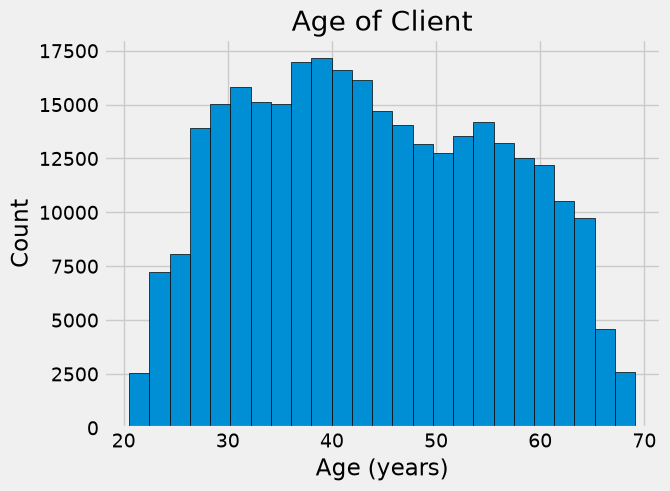

In [83]:
# Set the style of plots
plt.style.use('fivethirtyeight')

# Plot the distribution of ages in years
plt.hist(app_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

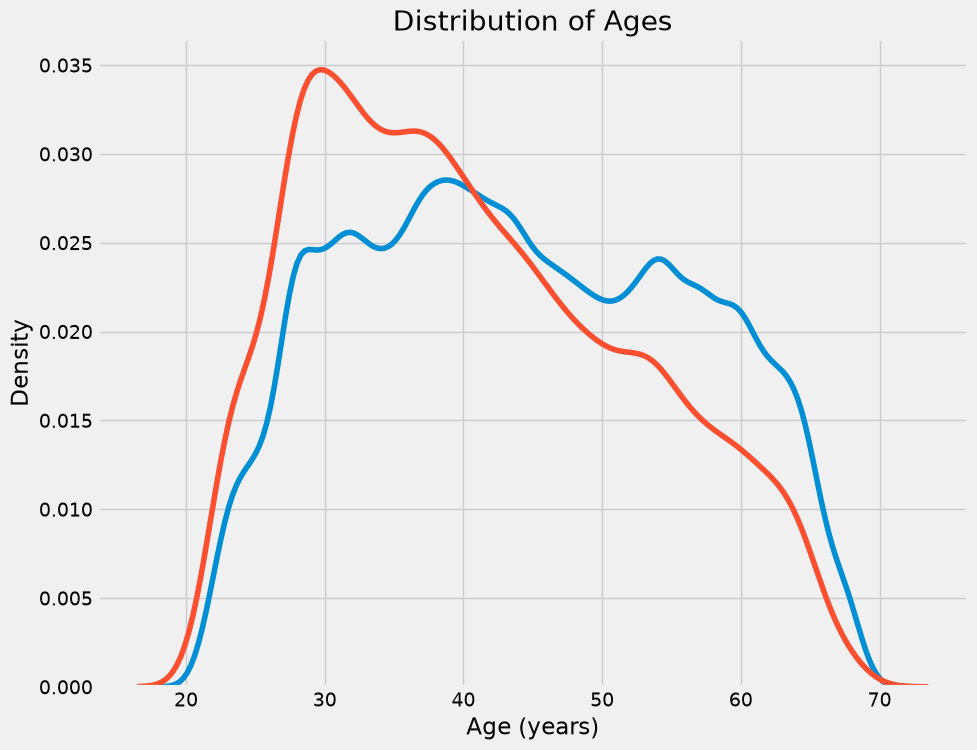

In [84]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

In [85]:
# Age information into a separate dataframe
age_data = app_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [86]:
# Group by the bin and calculate averages
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


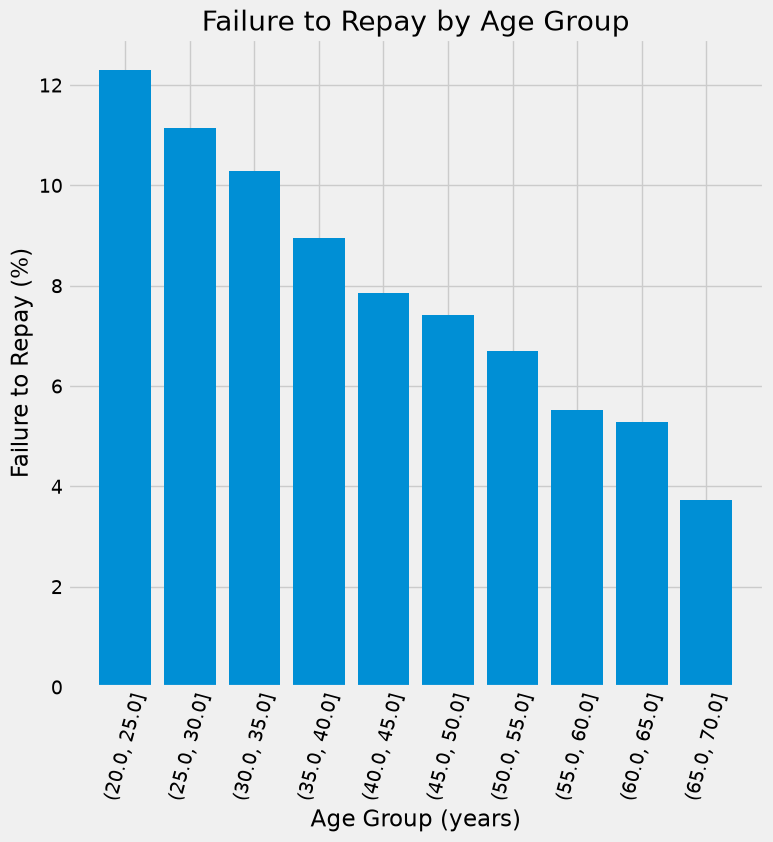

In [87]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

In [88]:
# Extract the EXT_SOURCE variables and show correlations
ext_data = app_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.000000,-0.155317,-0.160472,-0.178919,-0.078239
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186846,0.600610
EXT_SOURCE_2,-0.160472,0.213982,1.000000,0.109167,0.091996
EXT_SOURCE_3,-0.178919,0.186846,0.109167,1.000000,0.205478
DAYS_BIRTH,-0.078239,0.600610,0.091996,0.205478,1.000000


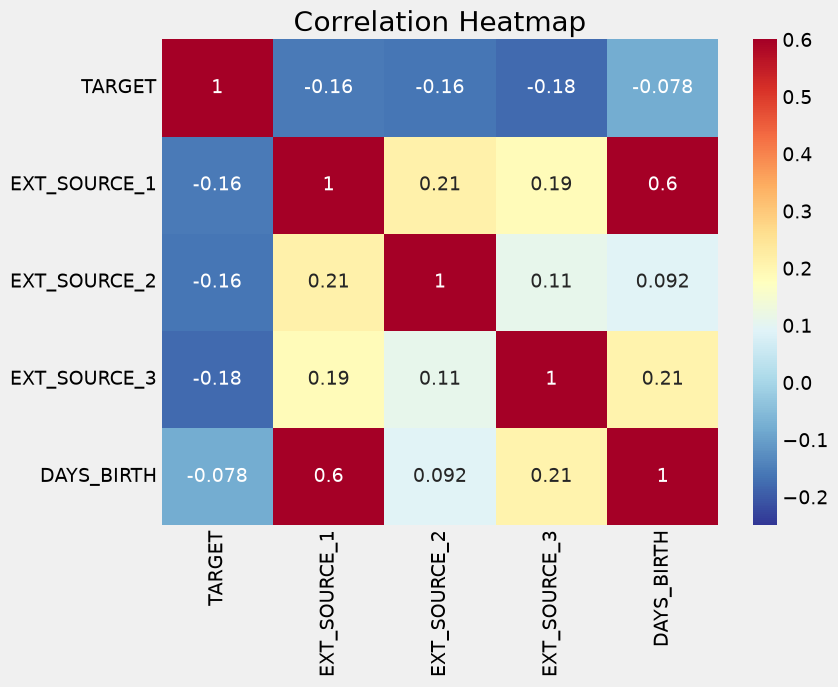

In [89]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

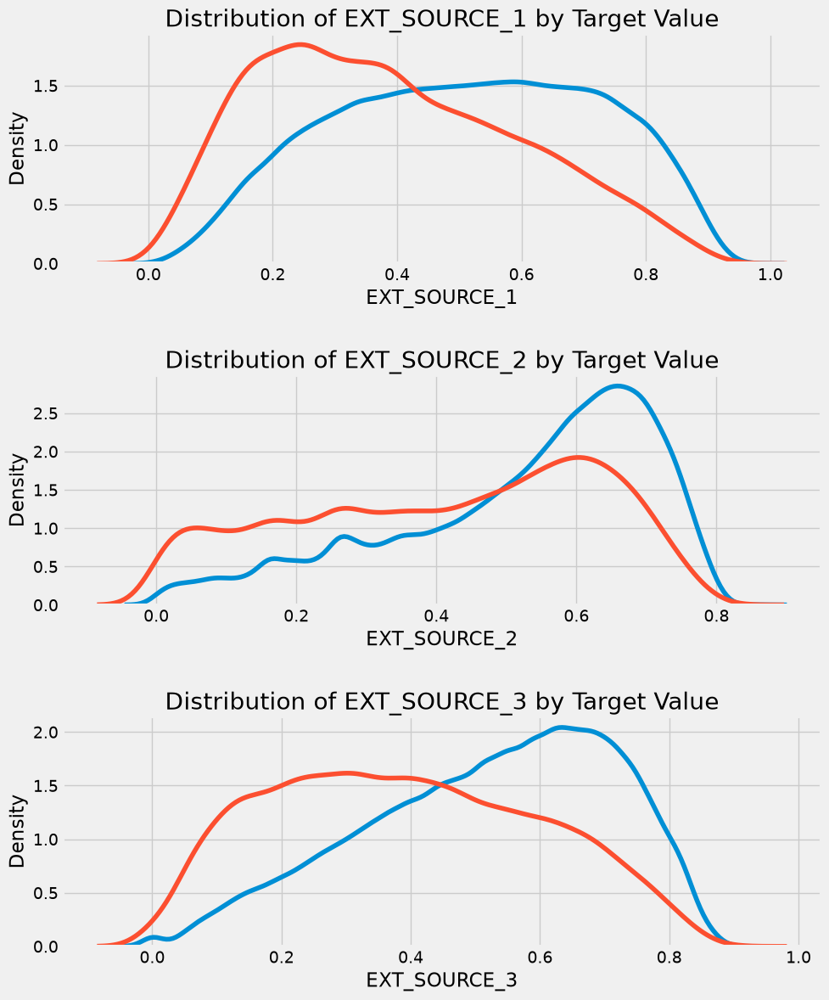

In [90]:
plt.figure(figsize = (10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    
    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, source], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, source], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)

### Pair Plot

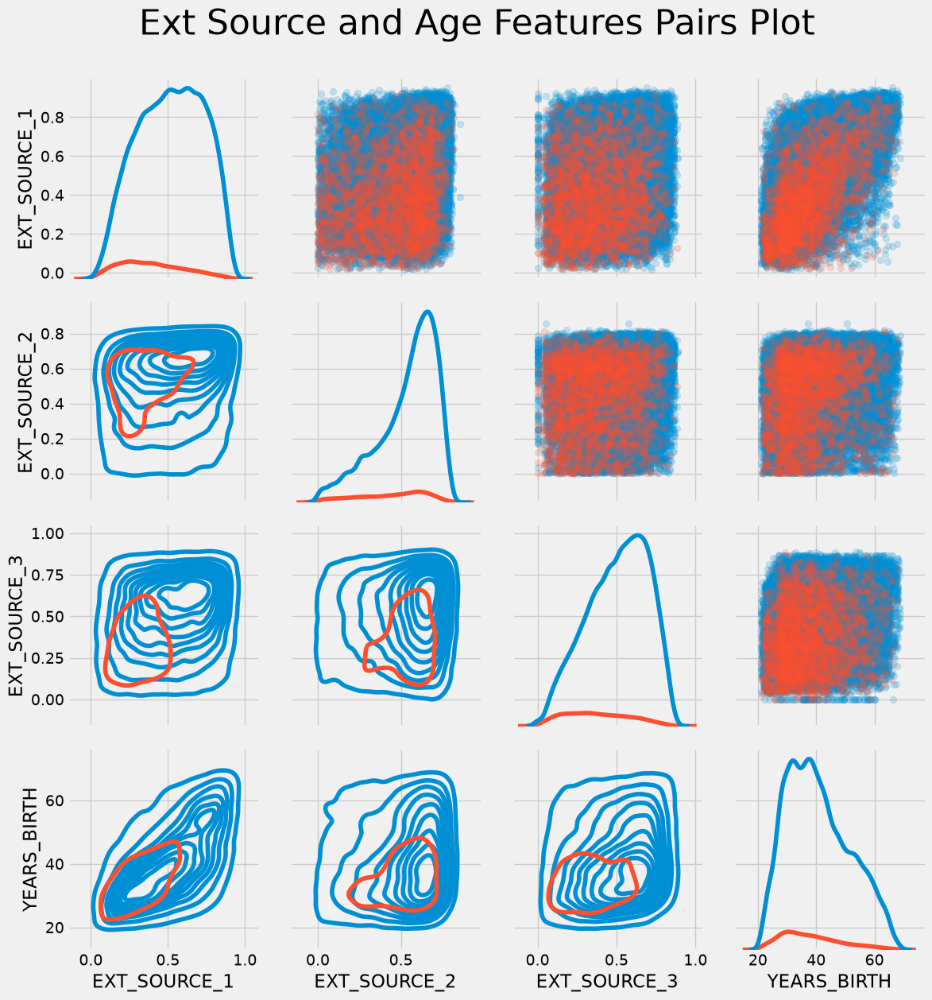

In [91]:
# Copy the data for plotting
plot_data = ext_data.drop(columns = ['DAYS_BIRTH']).copy()

# Add in the age of the client in years
plot_data['YEARS_BIRTH'] = age_data['YEARS_BIRTH']

# Drop na values and limit to first 100000 rows
plot_data = plot_data.dropna().loc[:100000, :]

# Function to calculate correlation coefficient between two columns
def corr_func(x, y, **kwargs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.2, .8), xycoords=ax.transAxes,
                size = 20)

# Create the pairgrid object
grid = sns.PairGrid(data = plot_data, height = 3, diag_sharey=False,
                    hue = 'TARGET',
                    vars = [x for x in list(plot_data.columns) if x != 'TARGET'])

# Upper is a scatter plot
grid.map_upper(plt.scatter, alpha = 0.2)

# Diagonal is a histogram
grid.map_diag(sns.kdeplot)

# Bottom is density plot
grid.map_lower(sns.kdeplot, cmap = plt.cm.OrRd_r);

plt.suptitle('Ext Source and Age Features Pairs Plot', size = 32, y = 1.05);

## 3. Feature engineering & fusion — kernel Aguiar

*Cette section produit le dataset final, fusionné et enrichi.* Le traitement est implémenté dans le script [`preprocess_datasets.py`](preprocess_datasets.py) (adapté du kernel *Aguiar — « LightGBM with Simple Features »*) et son résultat est sauvegardé dans `data/processed_data.csv`. On le recharge ici pour le valider.

**Ce que fait le pipeline (`preprocess_datasets.py`) :**

1. **`application_train_test`** : concatène train + test (pour un encodage cohérent), corrige la sentinelle `DAYS_EMPLOYED = 365243 → NaN`, encode les binaires par `factorize` et le reste en One-Hot, et crée des **ratios métier** :
   - `DAYS_EMPLOYED_PERC` = ancienneté / âge
   - `INCOME_CREDIT_PERC` = revenu / montant du crédit
   - `INCOME_PER_PERSON` = revenu / taille du foyer
   - `ANNUITY_INCOME_PERC` = annuité / revenu
   - `PAYMENT_RATE` = annuité / crédit
2. **`bureau_and_balance`**, **`previous_applications`**, **`pos_cash`**, **`installments_payments`**, **`credit_card_balance`** : chaque table est encodée en One-Hot puis **agrégée par `SK_ID_CURR`** (min/max/mean/sum/var + comptages). Des agrégats spécifiques sont créés pour les crédits **Actifs/Clôturés** (bureau) et les demandes **Acceptées/Refusées** (previous_application) — c'est là que réside l'essentiel de la valeur prédictive.
3. Tous les agrégats sont **joints en `left`** à la table `application` sur `SK_ID_CURR` → on conserve **1 ligne = 1 client**.

Résultat : **356 251 lignes** (307 511 train + 48 744 test) × **798 colonnes**. Les lignes du test ont `TARGET = NaN` (elles serviront à la prédiction finale).

In [92]:
df = pd.read_csv("data/processed_data.csv")
df.head()

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,False,0.0,0.0,0.0,False,False,0.0,0.0,0.0,6.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [93]:
print(
    f"df shape: {df.shape}\n"
    f"info: {df.info()}\n"
)

<class 'pandas.DataFrame'>
RangeIndex: 356251 entries, 0 to 356250
Columns: 798 entries, index to CC_COUNT
dtypes: bool(133), float64(606), int64(43), object(16)
memory usage: 1.8+ GB
df shape: (356251, 798)
info: None



In [94]:
# Contrôle qualité du dataset final : grain « 1 ligne = 1 client » préservé ?
n_train = df['TARGET'].notna().sum()
n_test = df['TARGET'].isna().sum()
print("Lignes totales                       :", len(df))
print("  dont train (TARGET renseigné)      :", n_train)
print("  dont test  (TARGET = NaN)          :", n_test)
print("SK_ID_CURR dupliqués (doit être 0)   :", df['SK_ID_CURR'].duplicated().sum())
print("Lignes entièrement dupliquées        :", df.duplicated().sum())

Lignes totales                       : 356251
  dont train (TARGET renseigné)      : 307507
  dont test  (TARGET = NaN)          : 48744
SK_ID_CURR dupliqués (doit être 0)   : 0
Lignes entièrement dupliquées        : 0


In [95]:
df.isna().sum()

index                                    0
SK_ID_CURR                               0
TARGET                               48744
CODE_GENDER                              0
FLAG_OWN_CAR                             0
                                     ...  
CC_NAME_CONTRACT_STATUS_nan_MAX     252693
CC_NAME_CONTRACT_STATUS_nan_MEAN    252693
CC_NAME_CONTRACT_STATUS_nan_SUM     252693
CC_NAME_CONTRACT_STATUS_nan_VAR     253385
CC_COUNT                            252693
Length: 798, dtype: int64

<Axes: >

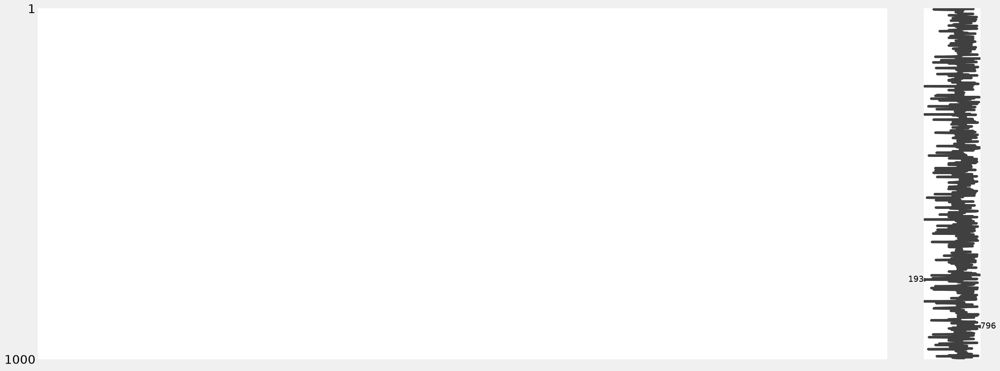

In [96]:
msno.matrix(df.sample(1000))

In [97]:
msno.bar(df)

<Axes: >

## 4. Conclusion — dataset prêt pour l'entraînement

**Livrable produit :** `data/processed_data.csv` — **356 251 × 798**, grain « 1 ligne = 1 client », sans doublon de `SK_ID_CURR`.

**Ce qui a été fait et justifié :**
- ✅ Chargement et inspection des 7 sources, identification des clés de jointure.
- ✅ Vérification des **doublons** (aucun `SK_ID_CURR` dupliqué, pas de recouvrement train/test).
- ✅ **Fusion maîtrisée** : agrégation par client *avant* jointure `left` → pas d'explosion de lignes ni de perte de clients.
- ✅ **Enrichissement** : ratios métier (`PAYMENT_RATE`, `ANNUITY_INCOME_PERC`…) et agrégats Actifs/Clôturés, Acceptés/Refusés.
- ✅ **Encodage** adapté au modèle (One-Hot nominal pour LightGBM ; label encoding réservé au binaire).
- ✅ **Valeurs manquantes** analysées et **stratégie d'imputation documentée** (laissée au modèle pour LightGBM, imputée en pipeline pour la baseline linéaire).
- ✅ **Déséquilibre** (~8 % de défauts) identifié : à traiter à l'entraînement (poids de classe / seuil sur coût métier), pas en amont.

**Prochaine étape :** entraînement des modèles (baseline régression logistique vs LightGBM), optimisation du seuil sur un **coût métier**, et suivi via MLflow.